# **Sciplex + L1000 Hyperparameter search**

In this notebook I run the hyperparameter search for the downstream analysis of treatment differences in the synovium.
We use untreated single cell data from [1] and paired bulk untreated and treated (16weeks) from [2] to infer the cell-type specific treatment effect.

1. Zhang, F. et al. Deconstruction of rheumatoid arthritis synovium defines inflammatory subtypes. Nature 623, 616–624 (2023).
DOI:10.1038/s41586-023-06708-y

2. Rivellese, F. et al. Rituximab versus tocilizumab in rheumatoid arthritis: synovial biopsy-based biomarker analysis of the phase 4 R4RA randomized trial. Nat. Med. 28, 1256–1268 (2022).


# **Imports**

In [7]:
# import the VAE code
import sys
from buddi import buddi
from buddi.preprocessing import sc_preprocess
from buddi.plotting import validation_plotting as vp


# general imports

import warnings
import numpy as np
import scanpy as sc
import scipy
import random


# Images, plots, display, and visualization
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from sklearn.preprocessing import scale, MinMaxScaler
from matplotlib_venn import venn2
from upsetplot import from_contents, UpSet

# programming stuff
import time
import os
import pickle
from pathlib import Path

# tensorflow stuff
import tensorflow as tf
from tensorflow.keras.optimizers.legacy import Adam
from tensorflow.keras.utils import to_categorical, normalize, plot_model


# disable eager execution
# https://github.com/tensorflow/tensorflow/issues/47311#issuecomment-786116401
from tensorflow.python.framework.ops import disable_eager_execution
disable_eager_execution()


In [8]:
## parameters
sc_aug_data_path = f"{os.getcwd()}/../data/single_cell_data/augmented_sciplex_data/"
res_data_path = f"{os.getcwd()}/../results/single_cell_data/buddiM2_sciplex/"

cibersort_genes_path = (f"{os.getcwd()}/../data/single_cell_data/cibersort_sciplex/" +
                        "CIBERSORTx_Job67_test_cybersort_sig_inferred_phenoclasses" +
                        ".CIBERSORTx_Job67_test_cybersort_sig_inferred_refsample.bm.K999.txt")



cibersort_path = f"{os.getcwd()}/../data/single_cell_data/cibersort_sciplex/"



num_genes = 7000

exp_id = "all-sciplex"
curr_treatment = "K562"
res_id = f"{curr_treatment}-sciplex"

RETRAIN_MODELS = False
RUN_CIBERSORT_GENES = False
RUN_CIBERSORT_SAMPLES = True


# Set-up experimental variables

In [9]:

##################################################
#####. set up experiment specific variables
##################################################

# number expected cell types
n_cell_types = 3

# number of patients/domains/samples expected
n_tot_samples = 1 # 

# number of drugs 
# one-hot encoded
n_drugs = 6

# number of types of sequencing (one-hot encoded)
n_tech = 2


# **Load / Pre-process data**
Import pre-processed pseudobulks

In [10]:
# get the info for CIBERSORT for generating the union_genes


if RUN_CIBERSORT_GENES:
    pseudobulks_df, prop_df, gene_df, sig_df, metadata_df = sc_preprocess.read_single_pseudobulk_file(sc_aug_data_path, "Tanespimycin (17-AAG)_MCF7", "CTRL", "Train", exp_id)
    pseudobulks_df.columns = gene_df

    # now we transpose
    pseudobulks_sparse = scipy.sparse.csr_matrix(pseudobulks_df.values)
    pseudobulks_sparse_t = pseudobulks_sparse.transpose()
    pseudobulks_df = pd.DataFrame.sparse.from_spmatrix(pseudobulks_sparse_t)
    pseudobulks_df.columns = range(pseudobulks_df.shape[1])

    # now write it out
    #sc_preprocess.write_cs_bp_files(cibersort_path, exp_id, sig_df, pseudobulks_df)
    sig_samp_df = sig_df

    sig_df_vals = sig_samp_df.iloc[:,1:]
    sig_df_celltype = sig_samp_df.scpred_CellType

    print("1")

    # now we transpose
    sig_sparse = scipy.sparse.csr_matrix(sig_df_vals.values)
    sig_sparse_t = sig_sparse.transpose()
    sig_sparse = pd.DataFrame.sparse.from_spmatrix(sig_sparse_t)
    sig_sparse.columns = sig_df_celltype
    sig_sparse.index = sig_samp_df.columns[1:]
    print("2")

    sig_sparse = pd.DataFrame(sig_sparse)
    sig_sparse = sig_sparse.sample(1000, axis=1)

    print("3")

    sig_out_file = os.path.join(cibersort_path, f"test_cybersort_sig.tsv.gz")
    sig_out_path = Path(sig_out_file)
    sig_sparse = sig_sparse.astype('int')
    sig_sparse.to_csv(sig_out_path, sep='\t',header=True)
    print("4")

    # write out the bulk RNA-seq mixture matrix
    sig_out_file = os.path.join(cibersort_path, f"test_cybersort_mix.tsv.gz")
    sig_out_path = Path(sig_out_file)

    pseudobulks_df.to_csv(sig_out_path, sep='\t',header=True)


In [11]:
np.random.seed(0)

# read in all the data

stim_order = ['CTRL', "STIM"]

cell_order = [curr_treatment]
drug_order = ["Tanespimycin (17-AAG)", "Fedratinib (SAR302503, TG101348)",
              "Trametinib (GSK1120212)", "Triamcinolone Acetonide", "Trichostatin A (TSA)"]

X_full = None
Y_full = None
meta_df = None
for curr_stim in stim_order:
    for curr_drug in drug_order:
        for curr_cell_type in cell_order:

            curr_samp = f"{curr_drug}_{curr_cell_type}"

            print(curr_samp)

            pseudobulks_df, prop_df, gene_df, sig_df, metadata_df = sc_preprocess.read_single_pseudobulk_file(sc_aug_data_path, curr_samp, curr_stim, "Train", exp_id)
            pseudobulks_df.columns = gene_df

            if X_full is None:
                X_full, Y_full, meta_df = pseudobulks_df, prop_df, metadata_df
            else:
                X_full = pd.concat([X_full, pseudobulks_df])
                Y_full = pd.concat([Y_full, prop_df])
                meta_df = pd.concat([meta_df, metadata_df])


X_full.columns = gene_df


# the perturbation is applied in a cell type specific manner
meta_df['perturbation'] = meta_df['perturbation'] + '_' + meta_df['cell_type_perturbed']
meta_df['perturbation'].iloc[np.where(meta_df.stim == "CTRL")] = "control"
meta_df["sample_id"] = "samp1"

# for the bulks, only keep the samples with
# the perturbed cell type as the majority
# or less than 20%

Y_max = np.copy(Y_full)
Y_max = np.argmax(Y_max, axis=1)
Y_max = Y_full.columns[Y_max]
meta_df["Y_max"] = Y_max

#idx_sc = np.where(meta_df.samp_type != "bulk")[0]
#idx_bulk_pert = np.where((meta_df.samp_type == "bulk") & (meta_df.Y_max == curr_treatment))[0]
#idx_keep = np.union1d(idx_sc, idx_bulk_pert)

#X_full = X_full.iloc[idx_keep]
#Y_full = Y_full.iloc[idx_keep]
#meta_df = meta_df.iloc[idx_keep]

Tanespimycin (17-AAG)_K562
Fedratinib (SAR302503, TG101348)_K562
Trametinib (GSK1120212)_K562
Triamcinolone Acetonide_K562
Trichostatin A (TSA)_K562
Tanespimycin (17-AAG)_K562
Fedratinib (SAR302503, TG101348)_K562
Trametinib (GSK1120212)_K562
Triamcinolone Acetonide_K562
Trichostatin A (TSA)_K562


In [12]:
# get the info for CIBERSORT for generating the union_genes


if RUN_CIBERSORT_SAMPLES:


    # read in all the data

    stim_order = ['CTRL', "STIM"]

    cell_order = [curr_treatment]
    drug_order = ["Tanespimycin (17-AAG)", "Fedratinib (SAR302503, TG101348)",
                "Trametinib (GSK1120212)", "Triamcinolone Acetonide", "Trichostatin A (TSA)"]

    X_full_bp = None
    Y_full_bp = None
    meta_df_bp = None
    for curr_stim in stim_order:
        for curr_drug in drug_order:
            for curr_cell_type in cell_order:

                curr_samp = f"{curr_drug}_{curr_cell_type}"

                print(curr_samp)

                pseudobulks_df, prop_df, gene_df, sig_df, metadata_df = sc_preprocess.read_single_pseudobulk_file(sc_aug_data_path, curr_samp, curr_stim, "Test", exp_id)
                pseudobulks_df.columns = gene_df


                # subset the samples
                # first we only want bulk, test, in both conditions
                bp_idx = np.logical_and(metadata_df.samp_type == "bulk", metadata_df.isTraining == "Test")

                # then we want to subsample to ~10 in each condition
                bp_idx_ctrl = np.logical_and(bp_idx, metadata_df.stim == "CTRL")
                bp_idx_stim = np.logical_and(bp_idx, metadata_df.stim == "STIM")
                bp_idx_ctrl = np.where(bp_idx_ctrl)[0]
                bp_idx_stim = np.where(bp_idx_stim)[0].tolist()
                if len(bp_idx_ctrl) > 0:
                    bp_idx_ctrl = np.random.choice(bp_idx_ctrl, 10)
                if len(bp_idx_stim) > 0:
                    bp_idx_stim = np.random.choice(bp_idx_stim, 10)

                bp_idx = np.union1d(bp_idx_ctrl, bp_idx_stim)

                metadata_df = metadata_df.iloc[bp_idx]
                pseudobulks_df = pseudobulks_df.iloc[bp_idx]
                prop_df = prop_df.iloc[bp_idx]

                if X_full_bp is None:
                    X_full_bp, Y_full_bp, meta_df_bp = pseudobulks_df, prop_df, metadata_df
                else:
                    X_full_bp = pd.concat([X_full_bp, pseudobulks_df])
                    Y_full_bp = pd.concat([Y_full_bp, prop_df])
                    meta_df_bp = pd.concat([meta_df_bp, metadata_df])


    X_full_bp.columns = gene_df

    


    # the perturbation is applied in a cell type specific manner
    meta_df_bp['perturbation'] = meta_df_bp['perturbation'] + '_' + meta_df_bp['cell_type_perturbed']
    meta_df_bp['perturbation'].iloc[np.where(meta_df_bp.stim == "CTRL")] = "control"
    meta_df_bp["sample_id"] = "samp1"

    # for the bulks, only keep the samples with
    # the perturbed cell type as the majority
    # or less than 20%

    Y_max = np.copy(Y_full_bp)
    Y_max = np.argmax(Y_max, axis=1)
    Y_max = Y_full_bp.columns[Y_max]
    meta_df_bp["Y_max"] = Y_max


    # now we transpose
    pseudobulks_sparse = scipy.sparse.csr_matrix(X_full_bp.values)
    pseudobulks_sparse_t = pseudobulks_sparse.transpose()
    pseudobulks_df = pd.DataFrame.sparse.from_spmatrix(pseudobulks_sparse_t)
    pseudobulks_df.columns = range(pseudobulks_df.shape[1])



    # write out the matrix
    sig_out_file = os.path.join(cibersort_path, f"{curr_treatment}_cybersort_sig.tsv.gz")
    sig_out_path = Path(sig_out_file)
    sig_df.to_csv(sig_out_path, sep='\t',header=True)

    sig_out_file = os.path.join(cibersort_path, f"{curr_treatment}_cybersort_mix.tsv.gz")
    sig_out_path = Path(sig_out_file)
    X_full_bp.to_csv(sig_out_path, sep='\t',header=True)

    sig_out_file = os.path.join(cibersort_path, f"{curr_treatment}_cybersort_Y.tsv.gz")
    sig_out_path = Path(sig_out_file)
    Y_full_bp.to_csv(sig_out_path, sep='\t',header=True)

    sig_out_file = os.path.join(cibersort_path, f"{curr_treatment}_cybersort_meta.tsv.gz")
    sig_out_path = Path(sig_out_file)
    meta_df_bp.to_csv(sig_out_path, sep='\t',header=True)


Tanespimycin (17-AAG)_K562
Fedratinib (SAR302503, TG101348)_K562
Trametinib (GSK1120212)_K562
Triamcinolone Acetonide_K562
Trichostatin A (TSA)_K562
Tanespimycin (17-AAG)_K562
Fedratinib (SAR302503, TG101348)_K562
Trametinib (GSK1120212)_K562
Triamcinolone Acetonide_K562
Trichostatin A (TSA)_K562


In [9]:
sig_df

gene_ids,scpred_CellType,AAAS,AACS,AAED1,AAGAB,AAK1,AAMDC,AAMP,AAR2,AARS,...,ZSWIM8,ZUFSP,ZW10,ZWILCH,ZXDC,ZYG11A,ZYG11B,ZYX,ZZEF1,ZZZ3
0,A549,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0
1,A549,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,2.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
2,A549,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
3,A549,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,A549,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9545,MCF7,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9546,MCF7,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,2.0
9547,MCF7,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0
9548,MCF7,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,2.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,2.0,1.0


In [139]:
meta_df

,sample_id,stim,isTraining,cell_prop_type,samp_type,perturbation,cell_type_perturbed,Y_max
0,samp1,CTRL,Train,random,bulk,control,MCF7,K562
1,samp1,CTRL,Train,random,bulk,control,MCF7,K562
2,samp1,CTRL,Train,random,bulk,control,MCF7,A549
3,samp1,CTRL,Train,random,bulk,control,MCF7,MCF7
4,samp1,CTRL,Train,random,bulk,control,MCF7,K562
...,...,...,...,...,...,...,...,...
495,samp1,STIM,Train,random,bulk,Trichostatin A (TSA)_MCF7,MCF7,MCF7
496,samp1,STIM,Train,random,bulk,Trichostatin A (TSA)_MCF7,MCF7,K562
497,samp1,STIM,Train,random,bulk,Trichostatin A (TSA)_MCF7,MCF7,A549
498,samp1,STIM,Train,random,bulk,Trichostatin A (TSA)_MCF7,MCF7,K562


In [140]:
tab = meta_df.groupby(['samp_type', 'stim']).size()
tab.unstack()

stim,CTRL,STIM
samp_type,,
bulk,2500.0,2500.0
sc_ref,10000.0,NaN


In [141]:
tab = meta_df.groupby(['samp_type', 'perturbation']).size()
tab.unstack()

perturbation,"Fedratinib (SAR302503, TG101348)_MCF7",Tanespimycin (17-AAG)_MCF7,Trametinib (GSK1120212)_MCF7,Triamcinolone Acetonide_MCF7,Trichostatin A (TSA)_MCF7,control
samp_type,,,,,,
bulk,500.0,500.0,500.0,500.0,500.0,2500.0
sc_ref,NaN,NaN,NaN,NaN,NaN,10000.0


In [142]:
tab = meta_df.groupby(['samp_type', 'cell_type_perturbed']).size()
tab.unstack()

cell_type_perturbed,MCF7
samp_type,
bulk,5000
sc_ref,10000


# Define indices and set-up metadata

In [143]:

##################################################
#####. Design the experiment
##################################################


X_orig = np.copy(X_full)

# set up the metadata arrays and indices
samp_label = np.asarray(meta_df.sample_id)
index_label, numeric_label = np.unique(samp_label, return_inverse=True)
Label_full = numeric_label
label_full = to_categorical(numeric_label)

samp_drug = np.asarray(meta_df.perturbation)
index_drug, numeric_drug = np.unique(samp_drug, return_inverse=True)
Drug_full = numeric_drug
drug_full = to_categorical(numeric_drug)

samp_bulk = np.asarray(meta_df.samp_type)
index_bulk, numeric_bulk = np.unique(samp_bulk, return_inverse=True)
Bulk_full = numeric_bulk
bulk_full = to_categorical(numeric_bulk)


idx_train = np.where(meta_df.isTraining=="Train")[0] 
idx_test = np.where(meta_df.isTraining!="Train")[0] 
idx_bulk = np.where(meta_df.samp_type == "bulk")[0]
idx_sc = np.where(meta_df.samp_type != "bulk")[0]
idx_drug = np.where(meta_df.stim != "CTRL")[0]
idx_random = np.where(meta_df.cell_prop_type == "random")[0]



# now seperate out the training and testing data
X_train_df = X_full.iloc[idx_train]
Y_train_df = Y_full.iloc[idx_train]


# try using the cibersort genes
cibersort_df = pd.read_csv(cibersort_genes_path, sep="\t" )
cibersort_genes = cibersort_df["NAME"].values.tolist()

# only keep cibersort genes that are in common genes
cibersort_genes = np.intersect1d(gene_df, cibersort_genes)

# convert to data matrices
X_train = X_train_df.to_numpy()
Y_train = Y_train_df.to_numpy()


## get the top variable genes
X_colmean = X_train.mean(axis=0)
X_colvar = X_train.var(axis=0)
X_CoV = np.array(np.divide(X_colvar, X_colmean+0.001))

# need to get the genes such that
# the union of the highly variable and the
# CIBERSORTx genes are 7000 total
num_genes_found = False
initial_count = 7000
while not num_genes_found:
    idx_top = np.argpartition(X_CoV, -initial_count)[-initial_count:]
    top_gene_df = gene_df.iloc[idx_top]
    CoV_only = np.union1d(top_gene_df, cibersort_genes)
    if len(CoV_only) == 7000:
        num_genes_found = True
    else:
        initial_count = initial_count -1

idx_top = np.argpartition(X_CoV, -initial_count)[-initial_count:] 
gene_df = gene_df.iloc[idx_top]



# Make sure our test/train indicies are correct

Show some stats on the samples

In [144]:
X_train.shape

(15000, 8022)

In [145]:
tab = meta_df.groupby(['isTraining', 'samp_type']).size()
tab.unstack()

samp_type,bulk,sc_ref
isTraining,,
Train,5000,10000


In [146]:
tab = meta_df.iloc[idx_train].groupby(['isTraining', 'stim']).size()
tab.unstack()

stim,CTRL,STIM
isTraining,,
Train,12500,2500


# compare our variable genes with cibersort defined genes

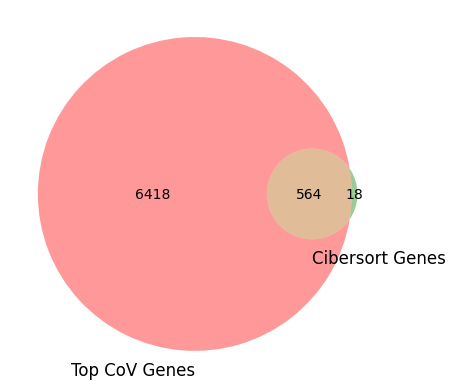

In [147]:

venn2([set(gene_df), set(cibersort_genes)], set_labels = ('Top CoV Genes', 'Cibersort Genes'))
plt.show()

In [148]:
union_genes = np.union1d(gene_df, cibersort_genes)
len(union_genes)

7000

# Normalize data

In [149]:
idx_bulk_train = np.intersect1d(idx_bulk, idx_train) 
len(idx_bulk_train)

5000

In [150]:
idx_sc_train = np.intersect1d(idx_sc, idx_train) 
len(idx_sc_train)

10000

In [151]:
X_full = X_full.loc[:,union_genes]

## normalize within sample
clip_upper = np.quantile(X_full, 0.9)
X_full = np.clip(X_full, 0, clip_upper)
scaler = MinMaxScaler()
scaler.fit(X_full)

# now normalize with the scaler trained on the 
# training data
X_full = scaler.transform(X_full)

# for unknown proportions; 
# this is bulks used in training
idx_bulk_train = np.intersect1d(idx_bulk, idx_train) 
#idx_bulk_train = np.random.choice(idx_bulk_train, 2000, replace=True)

X_unkp = X_full[idx_bulk_train,]
label_unkp = label_full[idx_bulk_train,]
drug_unkp = drug_full[idx_bulk_train,]
bulk_unkp = bulk_full[idx_bulk_train,]
y_unkp = Y_full.iloc[idx_bulk_train]
y_unkp = y_unkp.to_numpy()

# for known proportions
idx_sc_train = np.intersect1d(idx_sc, idx_train) 
#idx_sc_train = np.random.choice(idx_sc_train, 5000, replace=True)

X_kp = X_full[idx_sc_train,]
label_kp = label_full[idx_sc_train,]
drug_kp = drug_full[idx_sc_train,]
bulk_kp = bulk_full[idx_sc_train,]
y_kp = Y_full.iloc[idx_sc_train]
y_kp = y_kp.to_numpy()


In [152]:
all_trained_idx = np.union1d(idx_sc_train, idx_bulk_train)
tab = meta_df.iloc[all_trained_idx].groupby(['samp_type', 'stim']).size()
tab.unstack()

stim,CTRL,STIM
samp_type,,
bulk,2500.0,2500.0
sc_ref,10000.0,NaN


In [153]:
tab = meta_df.iloc[all_trained_idx].groupby(['samp_type', 'perturbation']).size()
tab.unstack()

perturbation,"Fedratinib (SAR302503, TG101348)_MCF7",Tanespimycin (17-AAG)_MCF7,Trametinib (GSK1120212)_MCF7,Triamcinolone Acetonide_MCF7,Trichostatin A (TSA)_MCF7,control
samp_type,,,,,,
bulk,500.0,500.0,500.0,500.0,500.0,2500.0
sc_ref,NaN,NaN,NaN,NaN,NaN,10000.0


In [154]:
tab = meta_df.iloc[all_trained_idx].groupby(['samp_type', 'cell_type_perturbed']).size()
tab.unstack()

cell_type_perturbed,MCF7
samp_type,
bulk,5000
sc_ref,10000


# Plot all data

In [155]:
Y_full

,A549,K562,MCF7
0,0.0180,0.5552,0.4268
0,0.0640,0.9324,0.0036
0,0.9486,0.0242,0.0272
0,0.2992,0.1164,0.5844
0,0.2964,0.6832,0.0204
...,...,...,...
0,0.0220,0.0250,0.9530
0,0.2850,0.5950,0.1200
0,0.4658,0.4100,0.1242
0,0.2252,0.6092,0.1656


[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 15000 samples in 0.020s...
[t-SNE] Computed neighbors for 15000 samples in 7.283s...
[t-SNE] Computed conditional probabilities for sample 1000 / 15000
[t-SNE] Computed conditional probabilities for sample 2000 / 15000
[t-SNE] Computed conditional probabilities for sample 3000 / 15000
[t-SNE] Computed conditional probabilities for sample 4000 / 15000
[t-SNE] Computed conditional probabilities for sample 5000 / 15000
[t-SNE] Computed conditional probabilities for sample 6000 / 15000
[t-SNE] Computed conditional probabilities for sample 7000 / 15000
[t-SNE] Computed conditional probabilities for sample 8000 / 15000
[t-SNE] Computed conditional probabilities for sample 9000 / 15000
[t-SNE] Computed conditional probabilities for sample 10000 / 15000
[t-SNE] Computed conditional probabilities for sample 11000 / 15000
[t-SNE] Computed conditional probabilities for sample 12000 / 15000
[t-SNE] Computed conditional probabilities for sam

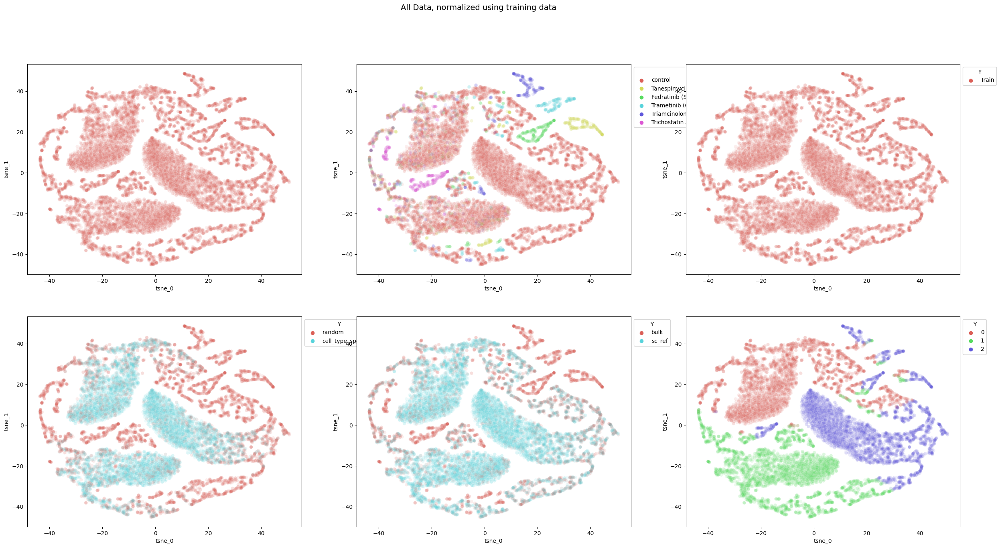

In [156]:
## plot samples
idx_tmp = np.union1d(idx_sc_train, idx_bulk_train)


plot_df = vp.get_tsne_for_plotting(X_full[idx_tmp,])

fig, axs = plt.subplots(2, 3, figsize=(30,15))

Y_temp = np.copy(Y_full.iloc[idx_tmp])
Y_temp = np.argmax(Y_temp, axis=1) 

vp.plot_tsne(plot_df, meta_df.iloc[idx_tmp].sample_id.to_numpy(), axs[0,0], title=f"")
vp.plot_tsne(plot_df, meta_df.iloc[idx_tmp].perturbation.to_numpy(), axs[0,1], title=f"")
vp.plot_tsne(plot_df, meta_df.iloc[idx_tmp].isTraining.to_numpy(), axs[0,2], title=f"")
vp.plot_tsne(plot_df, meta_df.iloc[idx_tmp].cell_prop_type.to_numpy(), axs[1,0], title=f"")
vp.plot_tsne(plot_df, meta_df.iloc[idx_tmp].samp_type.to_numpy(), axs[1,1], title=f"")
vp.plot_tsne(plot_df, Y_temp, axs[1,2], title=f"")


fig.suptitle("All Data, normalized using training data", fontsize=14)

axs[0,0].legend([],[], frameon=False)

fig.show()


[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 1000 samples in 0.002s...
[t-SNE] Computed neighbors for 1000 samples in 0.060s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1000
[t-SNE] Mean sigma: 0.916770
[t-SNE] KL divergence after 250 iterations with early exaggeration: 56.714035


[t-SNE] KL divergence after 500 iterations: 0.612199
(1000, 2)
(1000, 2)


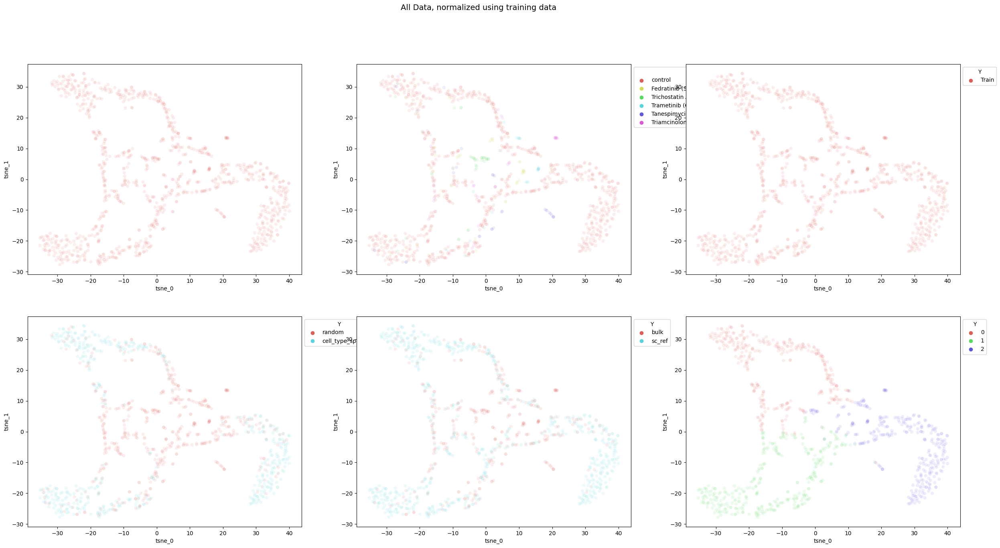

In [157]:
## plot samples
idx_tmp = np.random.choice(range(X_full.shape[0]), 1000, replace=True)


plot_df = vp.get_tsne_for_plotting(X_full[idx_tmp,])

fig, axs = plt.subplots(2, 3, figsize=(30,15))

Y_temp = np.copy(Y_full.iloc[idx_tmp])
Y_temp = np.argmax(Y_temp, axis=1) 

vp.plot_tsne(plot_df, meta_df.iloc[idx_tmp].sample_id.to_numpy(), axs[0,0], title=f"")
vp.plot_tsne(plot_df, meta_df.iloc[idx_tmp].perturbation.to_numpy(), axs[0,1], title=f"")
vp.plot_tsne(plot_df, meta_df.iloc[idx_tmp].isTraining.to_numpy(), axs[0,2], title=f"")
vp.plot_tsne(plot_df, meta_df.iloc[idx_tmp].cell_prop_type.to_numpy(), axs[1,0], title=f"")
vp.plot_tsne(plot_df, meta_df.iloc[idx_tmp].samp_type.to_numpy(), axs[1,1], title=f"")
vp.plot_tsne(plot_df, Y_temp, axs[1,2], title=f"")


fig.suptitle("All Data, normalized using training data", fontsize=14)

axs[0,0].legend([],[], frameon=False)

fig.show()


(5000, 2)
(5000, 2)


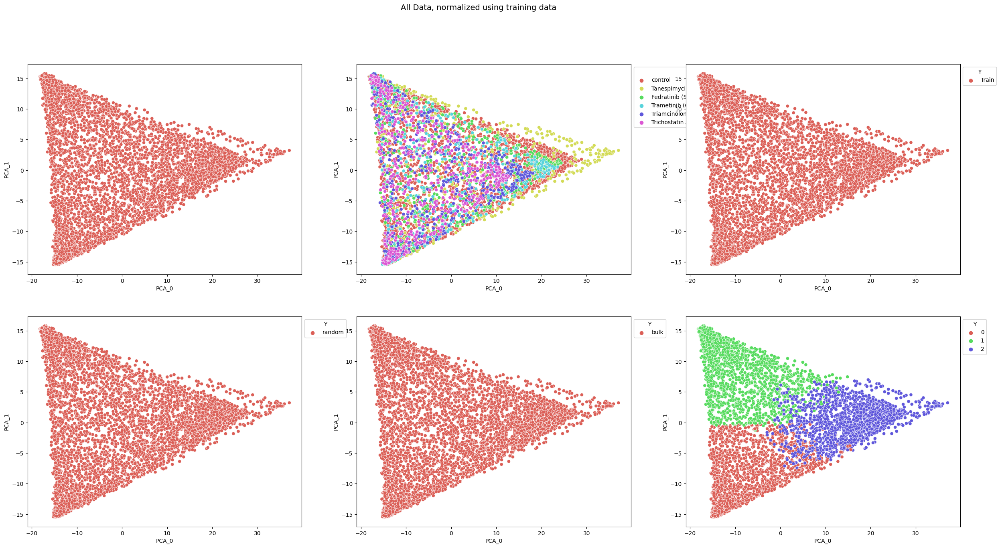

In [158]:
## plot samples
idx_interest = np.where(np.logical_and(meta_df.samp_type == "bulk", meta_df.isTraining == "Train"))[0]

plot_df = vp.get_pca_for_plotting(X_full[idx_interest])

fig, axs = plt.subplots(2, 3, figsize=(30,15))

Y_temp = np.copy(Y_full.iloc[idx_interest])
Y_temp = np.argmax(Y_temp, axis=1) 

vp.plot_pca(plot_df, meta_df.sample_id.to_numpy()[idx_interest], axs[0,0], title=f"", alpha=1)
vp.plot_pca(plot_df, meta_df.perturbation.to_numpy()[idx_interest], axs[0,1], title=f"", alpha=1)
vp.plot_pca(plot_df, meta_df.isTraining.to_numpy()[idx_interest], axs[0,2], title=f"", alpha=1)
vp.plot_pca(plot_df, meta_df.cell_prop_type.to_numpy()[idx_interest], axs[1,0], title=f"", alpha=1)
vp.plot_pca(plot_df, meta_df.samp_type.to_numpy()[idx_interest], axs[1,1], title=f"", alpha=1)
vp.plot_pca(plot_df, Y_temp, axs[1,2], title=f"", alpha=1)


fig.suptitle("All Data, normalized using training data", fontsize=14)

axs[0,0].legend([],[], frameon=False)

fig.show()


[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 1000 samples in 0.002s...
[t-SNE] Computed neighbors for 1000 samples in 0.059s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1000
[t-SNE] Mean sigma: 2.064903
[t-SNE] KL divergence after 250 iterations with early exaggeration: 58.996094


[t-SNE] KL divergence after 500 iterations: 0.460417
(1000, 2)
(1000, 2)


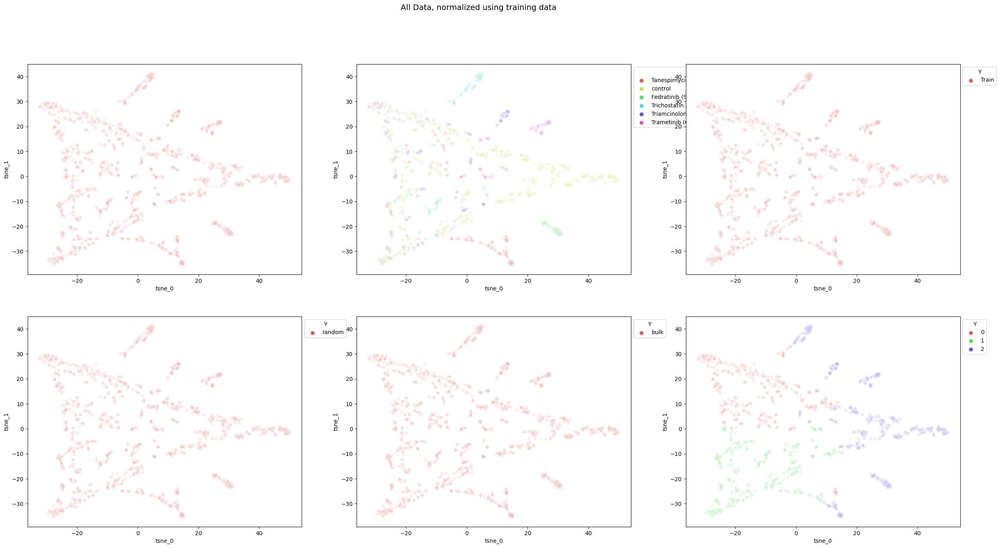

In [159]:
## plot samples
idx_interest = np.where(np.logical_and(meta_df.samp_type == "bulk", meta_df.isTraining == "Train"))[0]
idx_interest = np.random.choice(idx_interest, 1000, replace=True)

plot_df = vp.get_tsne_for_plotting(X_full[idx_interest])

fig, axs = plt.subplots(2, 3, figsize=(30,15))

Y_temp = np.copy(Y_full.iloc[idx_interest])
Y_temp = np.argmax(Y_temp, axis=1) 

vp.plot_tsne(plot_df, meta_df.sample_id.to_numpy()[idx_interest], axs[0,0], title=f"")
vp.plot_tsne(plot_df, meta_df.perturbation.to_numpy()[idx_interest], axs[0,1], title=f"")
vp.plot_tsne(plot_df, meta_df.isTraining.to_numpy()[idx_interest], axs[0,2], title=f"")
vp.plot_tsne(plot_df, meta_df.cell_prop_type.to_numpy()[idx_interest], axs[1,0], title=f"")
vp.plot_tsne(plot_df, meta_df.samp_type.to_numpy()[idx_interest], axs[1,1], title=f"")
vp.plot_tsne(plot_df, Y_temp, axs[1,2], title=f"")


fig.suptitle("All Data, normalized using training data", fontsize=14)

axs[0,0].legend([],[], frameon=False)

fig.show()


# **Run BuDDI**

## Hyperparameter Search

We are going to search over 2 parameters: 

1.  the weighting of the loss for the latent space classifications against the reconstruction (100, 1000, 10000)
2.  the number of epochs  (50, 100, 200)

In [160]:
X_unkp.shape

(5000, 7000)

In [161]:
X_unkp

array([[0.12989324, 0.35342692, 0.3002611 , ..., 0.43074792, 0.39741602,
        0.85489166],
       [0.05604982, 0.05862923, 0.07049608, ..., 0.32825485, 0.07803618,
        0.36703874],
       [0.09964413, 0.13129645, 0.33159269, ..., 0.11911357, 0.32299742,
        0.13328956],
       ...,
       [0.09608541, 0.09083402, 0.31070496, ..., 0.26592798, 0.25529716,
        0.26066973],
       [0.08540925, 0.10569777, 0.20626632, ..., 0.34487535, 0.14366925,
        0.33617859],
       [0.09964413, 0.09248555, 0.19060052, ..., 0.42105263, 0.15503876,
        0.43860801]])

# **Results**

Looking at all the results, we see that 200 epochs and weight of 100 gets the lowest reconstruction error and performs reasonably well in estimating the cell-type proportions.

**log10 reconstruction error:**

| Weight | 50 epochs | 100 epochs | 200 epochs |
| :---: | :---: | :---: | :---: |
| 100 | 4.8 | 4.19 | **4.04** |
| 1000 | 5.25 | 4.926 | 4.81 |
| 10000 | 5.35 | 6.28 | 6.51 |


**spearman error:**

| Weight | 50 epochs | 100 epochs | 200 epochs |
| :---: | :---: | :---: | :---: |
| 100 | 0.61 | 0.599 | **0.71** |
| 1000 | 0.571 | 0.631 | 0.667 |
| 10000 | 0.619 | 0.671 | 0.647 |


2024-09-06 22:35:51.393599: W tensorflow/c/c_api.cc:304] Operation '{name:'encoder_slack_26/bias/Assign' id:21070 op device:{requested: '', assigned: ''} def:{{{node encoder_slack_26/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](encoder_slack_26/bias, encoder_slack_26/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-09-06 22:35:52.718746: W tensorflow/c/c_api.cc:304] Operation '{name:'z_samp_slack_2/truediv/y' id:21413 op device:{requested: '', assigned: ''} def:{{{node z_samp_slack_2/truediv/y}} = Const[_has_manual_control_dependencies=true, dtype=DT_FLOAT, value=Tensor<type: float shape: [] values: 2>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error i

test_size_samp: 500
train_size_samp: 10000


2024-09-06 22:36:02.379000: W tensorflow/c/c_api.cc:304] Operation '{name:'training_8/Adam/rot_h2_2/bias/v/Assign' id:23461 op device:{requested: '', assigned: ''} def:{{{node training_8/Adam/rot_h2_2/bias/v/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training_8/Adam/rot_h2_2/bias/v, training_8/Adam/rot_h2_2/bias/v/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-09-06 22:36:10.048951: W tensorflow/c/c_api.cc:304] Operation '{name:'loss_5/AddN' id:22209 op device:{requested: '', assigned: ''} def:{{{node loss_5/AddN}} = AddN[N=4, T=DT_FLOAT, _has_manual_control_dependencies=true](loss_5/mul, loss_5/mul_1, loss_5/mul_2, loss_5/mul_3)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will

Elapsed:  1321.3592824935913
Epoch:  199
INFO:tensorflow:Assets written to: /home/natalie/projects/checkouts/buddi_analysis/l1000_sciplex_analysis/../results/single_cell_data/buddiM2_sciplex//model1_MCF7-sciplex_known_prop_vae/assets


INFO:tensorflow:Assets written to: /home/natalie/projects/checkouts/buddi_analysis/l1000_sciplex_analysis/../results/single_cell_data/buddiM2_sciplex//model1_MCF7-sciplex_known_prop_vae/assets


INFO:tensorflow:Assets written to: /home/natalie/projects/checkouts/buddi_analysis/l1000_sciplex_analysis/../results/single_cell_data/buddiM2_sciplex//model1_MCF7-sciplex_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /home/natalie/projects/checkouts/buddi_analysis/l1000_sciplex_analysis/../results/single_cell_data/buddiM2_sciplex//model1_MCF7-sciplex_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /home/natalie/projects/checkouts/buddi_analysis/l1000_sciplex_analysis/../results/single_cell_data/buddiM2_sciplex//model1_MCF7-sciplex_encoder_unlab/assets


INFO:tensorflow:Assets written to: /home/natalie/projects/checkouts/buddi_analysis/l1000_sciplex_analysis/../results/single_cell_data/buddiM2_sciplex//model1_MCF7-sciplex_encoder_unlab/assets


INFO:tensorflow:Assets written to: /home/natalie/projects/checkouts/buddi_analysis/l1000_sciplex_analysis/../results/single_cell_data/buddiM2_sciplex//model1_MCF7-sciplex_encoder_lab/assets


INFO:tensorflow:Assets written to: /home/natalie/projects/checkouts/buddi_analysis/l1000_sciplex_analysis/../results/single_cell_data/buddiM2_sciplex//model1_MCF7-sciplex_encoder_lab/assets


INFO:tensorflow:Assets written to: /home/natalie/projects/checkouts/buddi_analysis/l1000_sciplex_analysis/../results/single_cell_data/buddiM2_sciplex//model1_MCF7-sciplex_decoder/assets


INFO:tensorflow:Assets written to: /home/natalie/projects/checkouts/buddi_analysis/l1000_sciplex_analysis/../results/single_cell_data/buddiM2_sciplex//model1_MCF7-sciplex_decoder/assets


INFO:tensorflow:Assets written to: /home/natalie/projects/checkouts/buddi_analysis/l1000_sciplex_analysis/../results/single_cell_data/buddiM2_sciplex//model1_MCF7-sciplex_classifier/assets


INFO:tensorflow:Assets written to: /home/natalie/projects/checkouts/buddi_analysis/l1000_sciplex_analysis/../results/single_cell_data/buddiM2_sciplex//model1_MCF7-sciplex_classifier/assets
2024-09-06 22:58:15.489471: W tensorflow/c/c_api.cc:304] Operation '{name:'encoder_bulk_27/bias/Assign' id:26047 op device:{requested: '', assigned: ''} def:{{{node encoder_bulk_27/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](encoder_bulk_27/bias, encoder_bulk_27/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-09-06 22:58:16.466550: W tensorflow/c/c_api.cc:304] Operation '{name:'z_samp_slack_3/truediv/y' id:26318 op device:{requested: '', assigned: ''} def:{{{node z_samp_slack_3/truediv/y}} = Const[_has_manual_control_dependencies=true, dtype=DT_

test_size_samp: 500
train_size_samp: 10000


2024-09-06 22:58:22.981024: W tensorflow/c/c_api.cc:304] Operation '{name:'decoder_h1_21/kernel/Assign' id:26418 op device:{requested: '', assigned: ''} def:{{{node decoder_h1_21/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](decoder_h1_21/kernel, decoder_h1_21/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-09-06 22:58:28.083276: W tensorflow/c/c_api.cc:304] Operation '{name:'loss_7/AddN' id:27114 op device:{requested: '', assigned: ''} def:{{{node loss_7/AddN}} = AddN[N=4, T=DT_FLOAT, _has_manual_control_dependencies=true](loss_7/mul, loss_7/mul_1, loss_7/mul_2, loss_7/mul_3)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the 

Elapsed:  1329.4375293254852
Epoch:  199
INFO:tensorflow:Assets written to: /home/natalie/projects/checkouts/buddi_analysis/l1000_sciplex_analysis/../results/single_cell_data/buddiM2_sciplex//model2_MCF7-sciplex_known_prop_vae/assets


INFO:tensorflow:Assets written to: /home/natalie/projects/checkouts/buddi_analysis/l1000_sciplex_analysis/../results/single_cell_data/buddiM2_sciplex//model2_MCF7-sciplex_known_prop_vae/assets


INFO:tensorflow:Assets written to: /home/natalie/projects/checkouts/buddi_analysis/l1000_sciplex_analysis/../results/single_cell_data/buddiM2_sciplex//model2_MCF7-sciplex_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /home/natalie/projects/checkouts/buddi_analysis/l1000_sciplex_analysis/../results/single_cell_data/buddiM2_sciplex//model2_MCF7-sciplex_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /home/natalie/projects/checkouts/buddi_analysis/l1000_sciplex_analysis/../results/single_cell_data/buddiM2_sciplex//model2_MCF7-sciplex_encoder_unlab/assets


INFO:tensorflow:Assets written to: /home/natalie/projects/checkouts/buddi_analysis/l1000_sciplex_analysis/../results/single_cell_data/buddiM2_sciplex//model2_MCF7-sciplex_encoder_unlab/assets


INFO:tensorflow:Assets written to: /home/natalie/projects/checkouts/buddi_analysis/l1000_sciplex_analysis/../results/single_cell_data/buddiM2_sciplex//model2_MCF7-sciplex_encoder_lab/assets


INFO:tensorflow:Assets written to: /home/natalie/projects/checkouts/buddi_analysis/l1000_sciplex_analysis/../results/single_cell_data/buddiM2_sciplex//model2_MCF7-sciplex_encoder_lab/assets


INFO:tensorflow:Assets written to: /home/natalie/projects/checkouts/buddi_analysis/l1000_sciplex_analysis/../results/single_cell_data/buddiM2_sciplex//model2_MCF7-sciplex_decoder/assets


INFO:tensorflow:Assets written to: /home/natalie/projects/checkouts/buddi_analysis/l1000_sciplex_analysis/../results/single_cell_data/buddiM2_sciplex//model2_MCF7-sciplex_decoder/assets


INFO:tensorflow:Assets written to: /home/natalie/projects/checkouts/buddi_analysis/l1000_sciplex_analysis/../results/single_cell_data/buddiM2_sciplex//model2_MCF7-sciplex_classifier/assets


INFO:tensorflow:Assets written to: /home/natalie/projects/checkouts/buddi_analysis/l1000_sciplex_analysis/../results/single_cell_data/buddiM2_sciplex//model2_MCF7-sciplex_classifier/assets
2024-09-06 23:20:45.783779: W tensorflow/c/c_api.cc:304] Operation '{name:'sigma_bulk_28/kernel/Assign' id:31132 op device:{requested: '', assigned: ''} def:{{{node sigma_bulk_28/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](sigma_bulk_28/kernel, sigma_bulk_28/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-09-06 23:20:46.847852: W tensorflow/c/c_api.cc:304] Operation '{name:'z_samp_slack_4/truediv/y' id:31223 op device:{requested: '', assigned: ''} def:{{{node z_samp_slack_4/truediv/y}} = Const[_has_manual_control_dependenc

test_size_samp: 500
train_size_samp: 10000


2024-09-06 23:20:53.922702: W tensorflow/c/c_api.cc:304] Operation '{name:'training_16/Adam/mu_drug_28/bias/v/Assign' id:33213 op device:{requested: '', assigned: ''} def:{{{node training_16/Adam/mu_drug_28/bias/v/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training_16/Adam/mu_drug_28/bias/v, training_16/Adam/mu_drug_28/bias/v/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-09-06 23:20:59.450465: W tensorflow/c/c_api.cc:304] Operation '{name:'loss_9/AddN' id:32019 op device:{requested: '', assigned: ''} def:{{{node loss_9/AddN}} = AddN[N=4, T=DT_FLOAT, _has_manual_control_dependencies=true](loss_9/mul, loss_9/mul_1, loss_9/mul_2, loss_9/mul_3)}}' was changed by setting attribute after it was run by a session. This mutation will have no effe

Elapsed:  1360.9795093536377
Epoch:  199
INFO:tensorflow:Assets written to: /home/natalie/projects/checkouts/buddi_analysis/l1000_sciplex_analysis/../results/single_cell_data/buddiM2_sciplex//model3_MCF7-sciplex_known_prop_vae/assets


INFO:tensorflow:Assets written to: /home/natalie/projects/checkouts/buddi_analysis/l1000_sciplex_analysis/../results/single_cell_data/buddiM2_sciplex//model3_MCF7-sciplex_known_prop_vae/assets


INFO:tensorflow:Assets written to: /home/natalie/projects/checkouts/buddi_analysis/l1000_sciplex_analysis/../results/single_cell_data/buddiM2_sciplex//model3_MCF7-sciplex_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /home/natalie/projects/checkouts/buddi_analysis/l1000_sciplex_analysis/../results/single_cell_data/buddiM2_sciplex//model3_MCF7-sciplex_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /home/natalie/projects/checkouts/buddi_analysis/l1000_sciplex_analysis/../results/single_cell_data/buddiM2_sciplex//model3_MCF7-sciplex_encoder_unlab/assets


INFO:tensorflow:Assets written to: /home/natalie/projects/checkouts/buddi_analysis/l1000_sciplex_analysis/../results/single_cell_data/buddiM2_sciplex//model3_MCF7-sciplex_encoder_unlab/assets


INFO:tensorflow:Assets written to: /home/natalie/projects/checkouts/buddi_analysis/l1000_sciplex_analysis/../results/single_cell_data/buddiM2_sciplex//model3_MCF7-sciplex_encoder_lab/assets


INFO:tensorflow:Assets written to: /home/natalie/projects/checkouts/buddi_analysis/l1000_sciplex_analysis/../results/single_cell_data/buddiM2_sciplex//model3_MCF7-sciplex_encoder_lab/assets


INFO:tensorflow:Assets written to: /home/natalie/projects/checkouts/buddi_analysis/l1000_sciplex_analysis/../results/single_cell_data/buddiM2_sciplex//model3_MCF7-sciplex_decoder/assets


INFO:tensorflow:Assets written to: /home/natalie/projects/checkouts/buddi_analysis/l1000_sciplex_analysis/../results/single_cell_data/buddiM2_sciplex//model3_MCF7-sciplex_decoder/assets


INFO:tensorflow:Assets written to: /home/natalie/projects/checkouts/buddi_analysis/l1000_sciplex_analysis/../results/single_cell_data/buddiM2_sciplex//model3_MCF7-sciplex_classifier/assets


INFO:tensorflow:Assets written to: /home/natalie/projects/checkouts/buddi_analysis/l1000_sciplex_analysis/../results/single_cell_data/buddiM2_sciplex//model3_MCF7-sciplex_classifier/assets


2024-09-06 23:43:49.633715: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_796' id:36017 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_796}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](bias_351, Identity_3816)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


2024-09-06 23:43:51.952852: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_832' id:36424 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_832}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](bias_369, Identity_3852)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


2024-09-06 23:43:53.810746: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_835' id:36576 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_835}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](kernel_372, Identity_3855)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


2024-09-06 23:43:55.703596: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_838' id:36659 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_838}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](bias_374, Identity_3858)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


2024-09-06 23:43:58.085374: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_855' id:36948 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_855}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](kernel_380, Identity_3875)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


2024-09-06 23:44:00.521516: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_877' id:37327 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_877}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](kernel_391, Identity_3897)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


2024-09-06 23:44:02.486498: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_892' id:37503 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_892}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](bias_401, Identity_3912)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


2024-09-06 23:44:04.482040: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_896' id:37588 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_896}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](bias_403, Identity_3916)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


2024-09-06 23:44:06.975383: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_902' id:37855 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_902}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](bias_406, Identity_3922)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


2024-09-06 23:44:09.524175: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_940' id:38266 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_940}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](bias_423, Identity_3960)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


2024-09-06 23:44:11.581501: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_953' id:38438 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_953}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](kernel_431, Identity_3973)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


2024-09-06 23:44:13.668851: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_956' id:38521 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_956}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](bias_433, Identity_3976)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


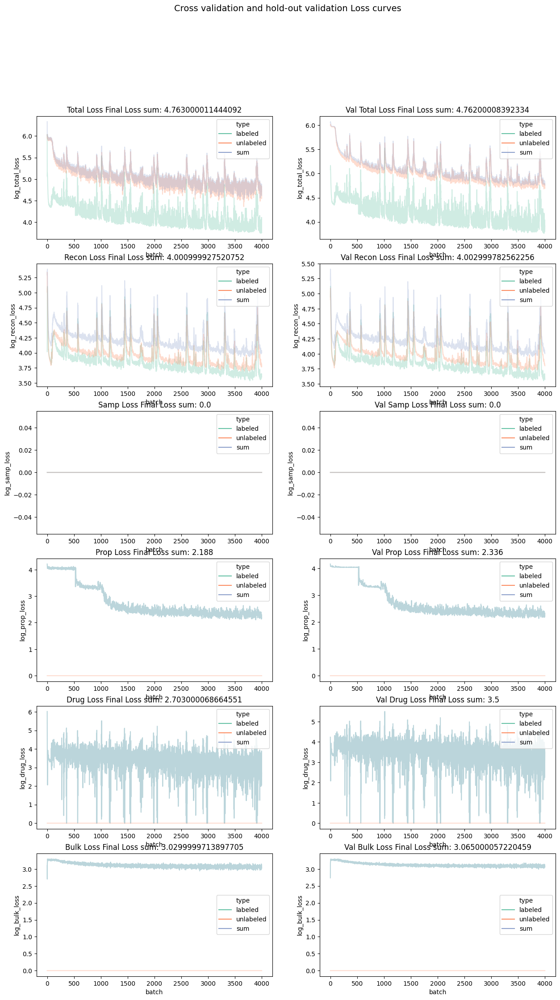

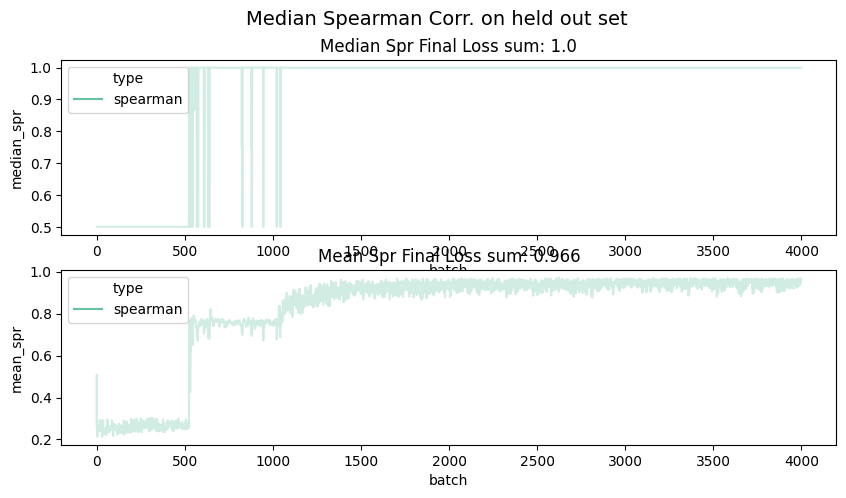

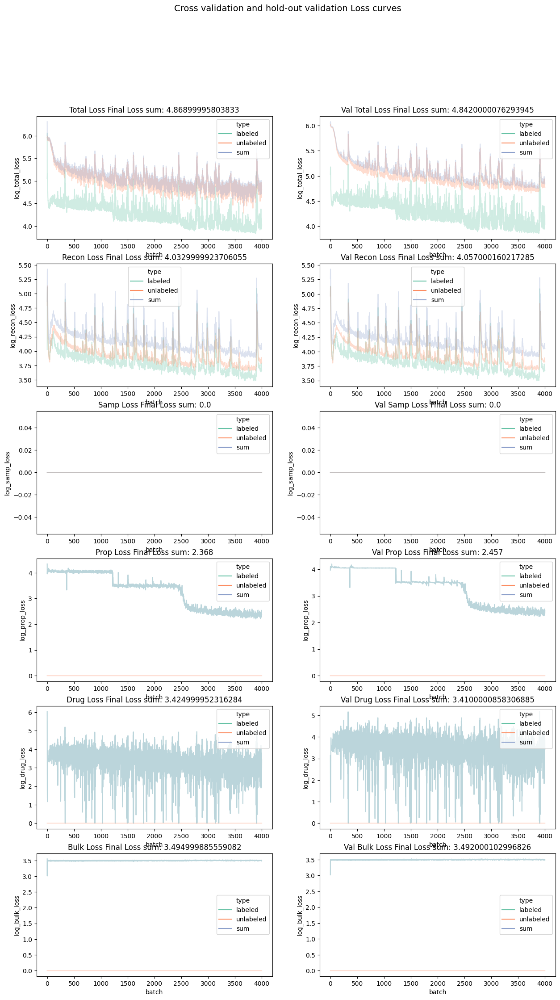

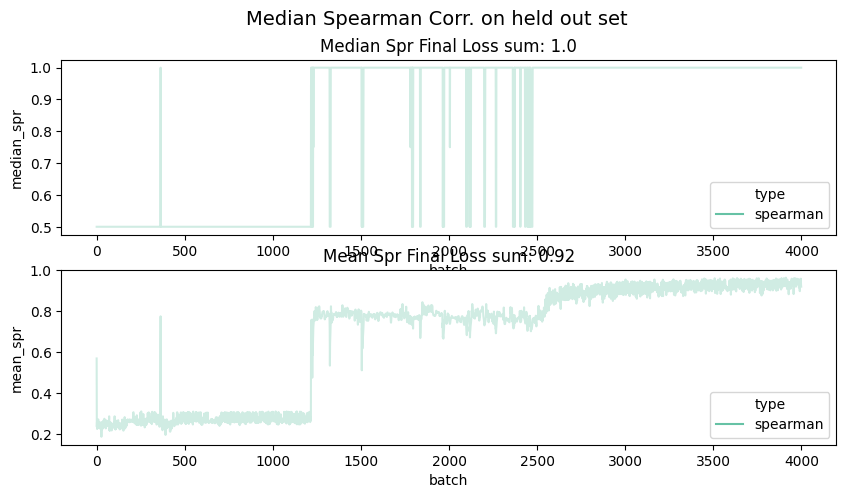

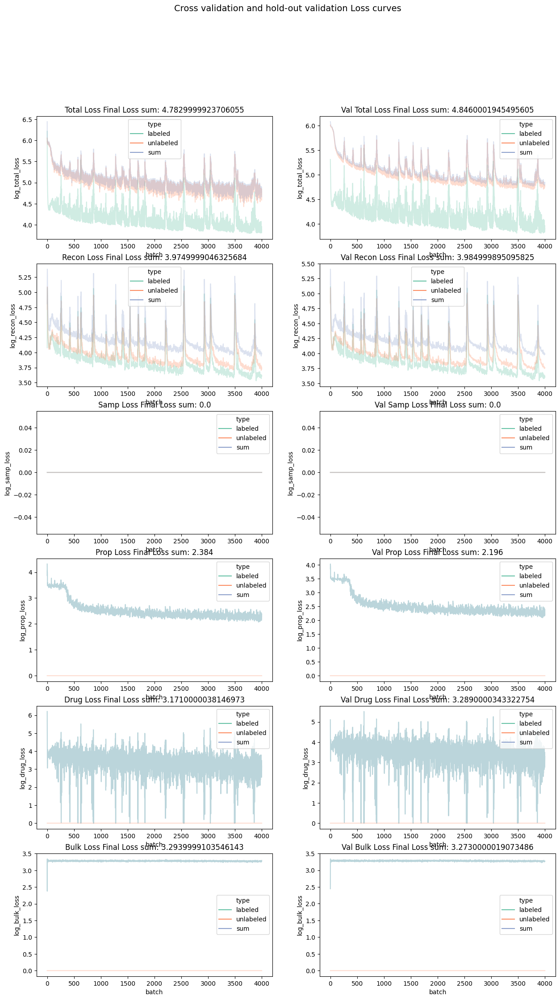

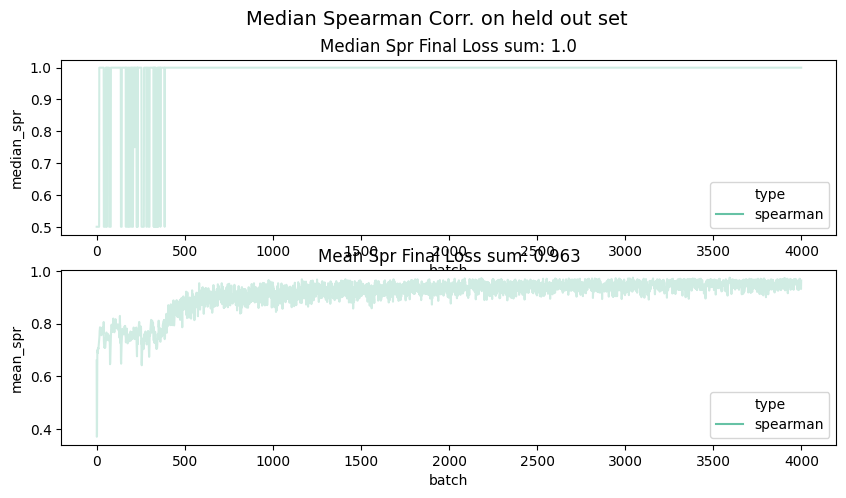

In [162]:
curr_n_epoch=200
curr_wt = 100

if True: # RETRAIN_MODELS

    params = buddi.BuddiTrainParameters(n_epoch=curr_n_epoch, 
            alpha_rot=curr_wt*0.1, alpha_prop=curr_wt, 
            alpha_bulk=curr_wt*0.1, alpha_drug=curr_wt*100,
            n_label_z=64, encoder_dim =256, decoder_dim =256, class_dim1=256, class_dim2=128)

    ## model 1
    curr_res_id = f"model1_{res_id}"
    res1 = buddi.train_buddi(res_data_path, curr_res_id, use_buddi4=True, 
                n_tot_samples=n_tot_samples, n_drugs=n_drugs, n_tech=n_tech, 
                X_unkp=X_unkp, label_unkp=label_unkp, drug_unkp=drug_unkp, bulk_unkp=bulk_unkp,
                X_kp=X_kp, y_kp=y_kp, label_kp=label_kp, drug_kp=drug_kp, bulk_kp=bulk_kp, params=params)

    ## model 2
    curr_res_id = f"model2_{res_id}"
    res2 = buddi.train_buddi(res_data_path, curr_res_id, use_buddi4=True, 
                n_tot_samples=n_tot_samples, n_drugs=n_drugs, n_tech=n_tech, 
                X_unkp=X_unkp, label_unkp=label_unkp, drug_unkp=drug_unkp, bulk_unkp=bulk_unkp,
                X_kp=X_kp, y_kp=y_kp, label_kp=label_kp, drug_kp=drug_kp, bulk_kp=bulk_kp, params=params)

    ## model 3
    curr_res_id = f"model3_{res_id}"
    res3 = buddi.train_buddi(res_data_path, curr_res_id, use_buddi4=True, 
               n_tot_samples=n_tot_samples, n_drugs=n_drugs, n_tech=n_tech, 
               X_unkp=X_unkp, label_unkp=label_unkp, drug_unkp=drug_unkp, bulk_unkp=bulk_unkp,
               X_kp=X_kp, y_kp=y_kp, label_kp=label_kp, drug_kp=drug_kp, bulk_kp=bulk_kp, params=params)


res1_enc_unlab = tf.keras.models.load_model(f"{res_data_path}/model1_{res_id}_encoder_unlab")
res1_enc_lab = tf.keras.models.load_model(f"{res_data_path}/model1_{res_id}_encoder_lab")
res1_dec = tf.keras.models.load_model(f"{res_data_path}/model1_{res_id}_decoder")
res1_classifier = tf.keras.models.load_model(f"{res_data_path}/model1_{res_id}_classifier")


res2_enc_unlab = tf.keras.models.load_model(f"{res_data_path}/model2_{res_id}_encoder_unlab")
res2_enc_lab = tf.keras.models.load_model(f"{res_data_path}/model2_{res_id}_encoder_lab")
res2_dec = tf.keras.models.load_model(f"{res_data_path}/model2_{res_id}_decoder")
res2_classifier = tf.keras.models.load_model(f"{res_data_path}/model2_{res_id}_classifier")


res3_enc_unlab = tf.keras.models.load_model(f"{res_data_path}/model3_{res_id}_encoder_unlab")
res3_enc_lab = tf.keras.models.load_model(f"{res_data_path}/model3_{res_id}_encoder_lab")
res3_dec = tf.keras.models.load_model(f"{res_data_path}/model3_{res_id}_decoder")
res3_classifier = tf.keras.models.load_model(f"{res_data_path}/model3_{res_id}_classifier")

## visualize latent spaces

### subset data

In [163]:
# subset the data to the training data
# to show our latent spaces are learning appropriately

#idx_tmp_bulk = np.where(np.logical_and(meta_df.isTraining == "Train", meta_df.cell_prop_type == "realistic"))[0]
#idx_tmp_bulk = np.random.choice(idx_tmp_bulk, 5000, replace=True)


idx_tmp = np.where(np.logical_and(meta_df.isTraining == "Train", meta_df.cell_prop_type != "realistic"))[0]
idx_tmp = np.random.choice(idx_tmp, 5000, replace=True)
#idx_tmp = np.concatenate((idx_tmp, idx_tmp_bulk))

X_temp = np.copy(X_full)
X_temp = X_temp[idx_tmp,]

Y_temp = np.copy(Y_full)
Y_temp = np.argmax(Y_temp, axis=1)
Y_temp = Y_temp[idx_tmp]
Y_temp = Y_full.columns[Y_temp]

label_temp = np.copy(Label_full)
label_temp = label_temp[idx_tmp]
label_temp = index_label[label_temp]

perturb_temp =np.copy(Drug_full)
perturb_temp = perturb_temp[idx_tmp]
perturb_temp = index_drug[perturb_temp]


bulk_temp =np.copy(Bulk_full)
bulk_temp = bulk_temp[idx_tmp]


### plot data

/home/natalie/projects/checkouts/buddi_atac/.venv/lib/python3.10/site-packages/keras/src/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,
2024-09-06 23:44:18.142742: W tensorflow/c/c_api.cc:304] Operation '{name:'tf_op_layer_z_samp_slack_2/add/z_samp_slack_2/add' id:36116 op device:{requested: '', assigned: ''} def:{{{node tf_op_layer_z_samp_slack_2/add/z_samp_slack_2/add}} = AddV2[T=DT_FLOAT, _cloned=true, _has_manual_control_dependencies=true](mu_slack_29/BiasAdd, tf_op_layer_z_samp_slack_2/mul/z_samp_slack_2/mul)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-09-06 23:44:19.313375: W tensorflow/c/c_api.cc:304] Operation '{name:'cls_out_17/Softma

(5000, 2)
(5000, 2)
(5000, 2)
(5000, 2)
(5000, 2)
(5000, 2)
(5000, 2)
(5000, 2)
(5000, 2)
(5000, 2)


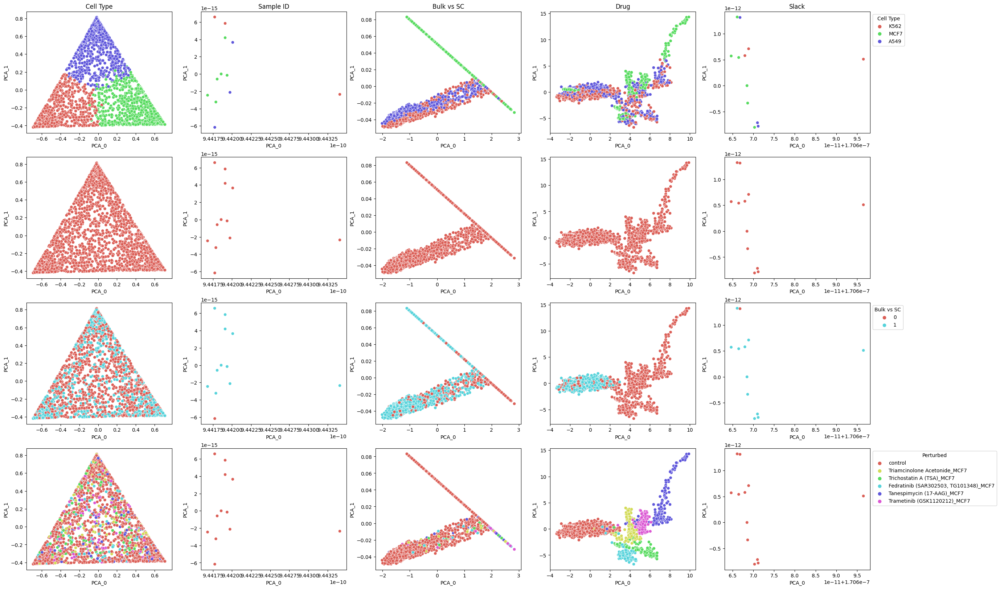

In [164]:

res1_latent_plot = buddi.plot_latent_spaces(res1_enc_unlab, res1_classifier,
                        X_temp, Y_temp, label_temp, perturb_temp, bulk_temp, 
                        batch_size=500, use_buddi4=True, hide_sample_ids=True, use_pca=True)

/home/natalie/projects/checkouts/buddi_atac/.venv/lib/python3.10/site-packages/keras/src/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,
2024-09-06 23:44:23.234889: W tensorflow/c/c_api.cc:304] Operation '{name:'tf_op_layer_z_samp_slack_3/add/z_samp_slack_3/add' id:37045 op device:{requested: '', assigned: ''} def:{{{node tf_op_layer_z_samp_slack_3/add/z_samp_slack_3/add}} = AddV2[T=DT_FLOAT, _cloned=true, _has_manual_control_dependencies=true](mu_slack_31/BiasAdd, tf_op_layer_z_samp_slack_3/mul/z_samp_slack_3/mul)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-09-06 23:44:24.392343: W tensorflow/c/c_api.cc:304] Operation '{name:'cls_out_18/Softma

(5000, 2)
(5000, 2)
(5000, 2)
(5000, 2)
(5000, 2)
(5000, 2)
(5000, 2)
(5000, 2)
(5000, 2)
(5000, 2)


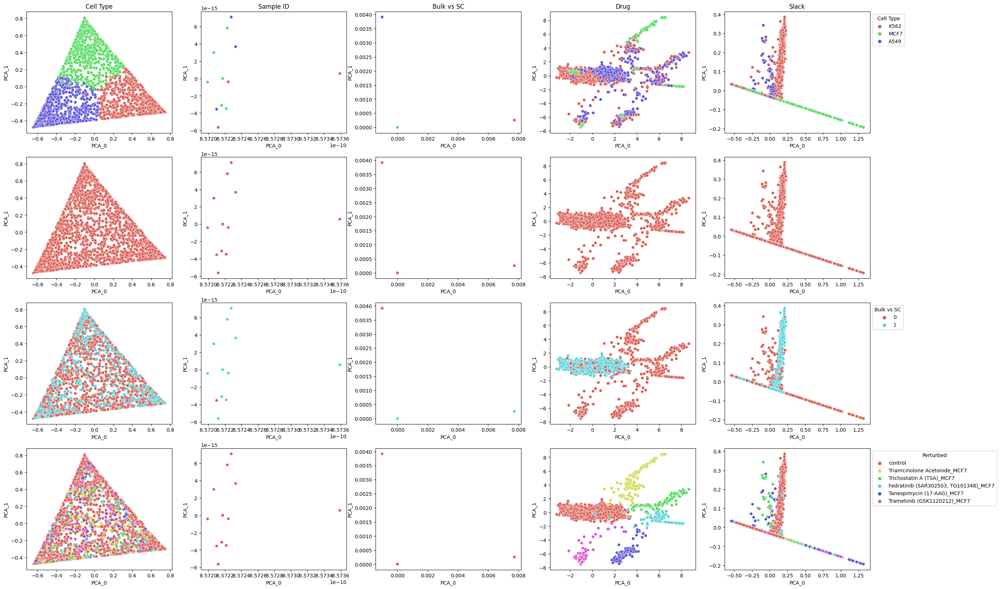

In [165]:

res2_latent_plot = buddi.plot_latent_spaces(res2_enc_unlab, res2_classifier,
                        X_temp, Y_temp, label_temp, perturb_temp, bulk_temp, 
                        batch_size=500, use_buddi4=True, hide_sample_ids=True)

/home/natalie/projects/checkouts/buddi_atac/.venv/lib/python3.10/site-packages/keras/src/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,
2024-09-06 23:44:28.497373: W tensorflow/c/c_api.cc:304] Operation '{name:'tf_op_layer_z_samp_slack_4/add/z_samp_slack_4/add' id:37974 op device:{requested: '', assigned: ''} def:{{{node tf_op_layer_z_samp_slack_4/add/z_samp_slack_4/add}} = AddV2[T=DT_FLOAT, _cloned=true, _has_manual_control_dependencies=true](mu_slack_33/BiasAdd, tf_op_layer_z_samp_slack_4/mul/z_samp_slack_4/mul)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-09-06 23:44:29.626449: W tensorflow/c/c_api.cc:304] Operation '{name:'cls_out_19/Softma

(5000, 2)
(5000, 2)
(5000, 2)
(5000, 2)
(5000, 2)
(5000, 2)
(5000, 2)
(5000, 2)
(5000, 2)
(5000, 2)


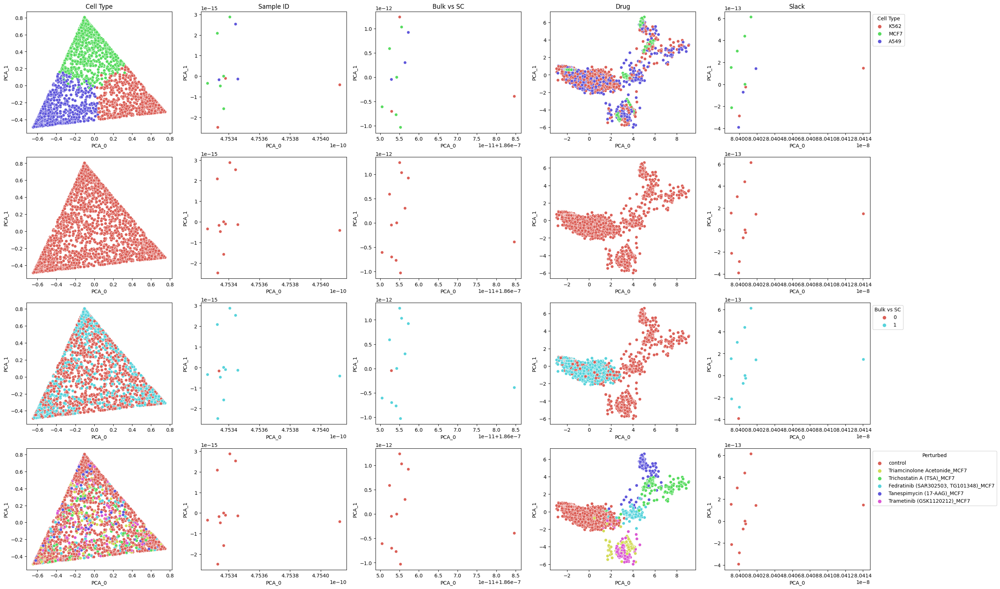

In [166]:

res3_latent_plot = buddi.plot_latent_spaces(res3_enc_unlab, res3_classifier,
                        X_temp, Y_temp, label_temp, perturb_temp, bulk_temp, 
                        batch_size=500, use_buddi4=True, hide_sample_ids=True)

## visualize reconstruction

### subset data

In [167]:
# take all training data

recon_idx = np.where(np.logical_and(meta_df.cell_prop_type != "realistic", meta_df.isTraining == "Train"))[0]
recon_idx = np.where(recon_idx)[0]
recon_idx = np.random.choice(recon_idx, 1000, replace=True)

# subset our data

meta_temp = meta_df.iloc[recon_idx]

X_temp = np.copy(X_full[recon_idx])

Y_temp = np.copy(Y_full.iloc[recon_idx])
Y_temp = np.argmax(Y_temp, axis=1)
Y_temp = Y_full.columns[Y_temp]


label_temp = np.copy(Label_full[recon_idx])
label_temp = index_label[label_temp]

perturb_temp = Drug_full[recon_idx]




### plot data

In [168]:
Y_full.iloc[recon_idx]

,A549,K562,MCF7
0,0.004200,0.034800,0.961000
0,0.015000,0.001000,0.984000
0,0.021774,0.942823,0.035403
0,0.829400,0.096400,0.074200
0,0.000301,0.000532,0.999167
...,...,...,...
0,0.005007,0.991771,0.003223
0,0.002836,0.990534,0.006630
0,0.983489,0.008197,0.008314
0,0.040105,0.076924,0.882971


/home/natalie/projects/checkouts/buddi_atac/.venv/lib/python3.10/site-packages/keras/src/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,
2024-09-06 23:44:33.683025: W tensorflow/c/c_api.cc:304] Operation '{name:'decoder_out_27/Sigmoid' id:36590 op device:{requested: '', assigned: ''} def:{{{node decoder_out_27/Sigmoid}} = Sigmoid[T=DT_FLOAT, _has_manual_control_dependencies=true](decoder_out_27/BiasAdd)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


(2000, 2)
(2000, 2)


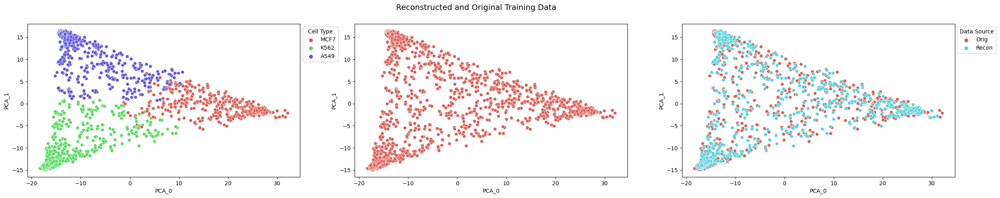

In [169]:
res1_recon_plot = buddi.plot_reconstruction_buddi(res1_enc_unlab, res1_classifier, res1_dec,
        X_temp, Y_temp, label_temp, perturb_temp, 
        batch_size=500, use_buddi4=True)

/home/natalie/projects/checkouts/buddi_atac/.venv/lib/python3.10/site-packages/keras/src/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,
2024-09-06 23:44:35.450506: W tensorflow/c/c_api.cc:304] Operation '{name:'decoder_out_28/Sigmoid' id:37519 op device:{requested: '', assigned: ''} def:{{{node decoder_out_28/Sigmoid}} = Sigmoid[T=DT_FLOAT, _has_manual_control_dependencies=true](decoder_out_28/BiasAdd)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


(2000, 2)
(2000, 2)


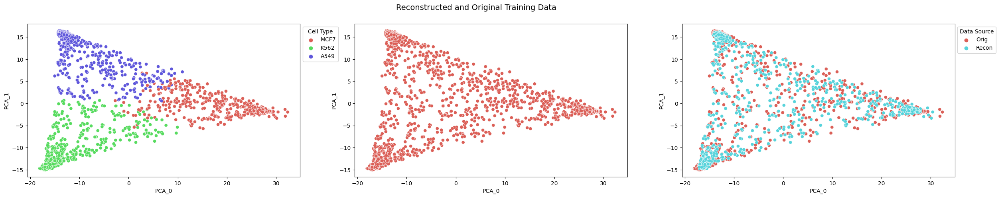

In [170]:
res2_recon_plot = buddi.plot_reconstruction_buddi(res2_enc_unlab, res2_classifier, res2_dec,
        X_temp, Y_temp, label_temp, perturb_temp, 
        batch_size=500, use_buddi4=True)

/home/natalie/projects/checkouts/buddi_atac/.venv/lib/python3.10/site-packages/keras/src/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,
2024-09-06 23:44:37.180099: W tensorflow/c/c_api.cc:304] Operation '{name:'decoder_out_29/Sigmoid' id:38448 op device:{requested: '', assigned: ''} def:{{{node decoder_out_29/Sigmoid}} = Sigmoid[T=DT_FLOAT, _has_manual_control_dependencies=true](decoder_out_29/BiasAdd)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


(2000, 2)
(2000, 2)


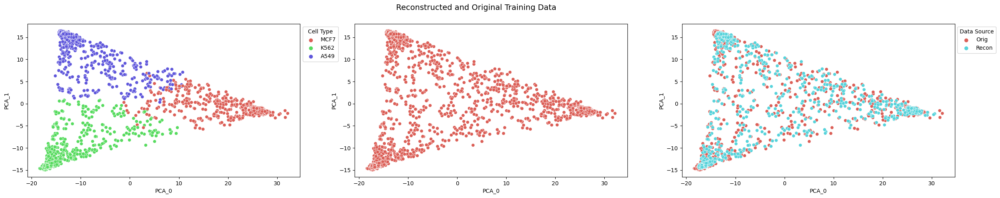

In [171]:
res3_recon_plot = buddi.plot_reconstruction_buddi(res3_enc_unlab, res3_classifier, res3_dec,
        X_temp, Y_temp, label_temp, perturb_temp, 
        batch_size=500, use_buddi4=True)